# L0. Introduction to Music as Data

Eamonn Bell \<eamonn.bell@durham.ac.uk\>  
Department of Computer Science  
Durham University

Guest lecture for Master of Data Science (Digital Humanities) students  
Digital Humanities: Practice and Theory (Heslin)  
9a-11a, 1p-2p; November 28, 2021

> **Note**: Much of this material is adapted with sometimes quite minor modifications from excellent resources by Meinard Müller, Steve Tjoa, Brian McFee, and the many authors of the documentation for the `librosa`, `numpy`, and `scipy` packages.  

> It primarily explores recorded sound and music as time-domain phenomena, and frequency-domain representations are only introduced intuitively by appeal to spectrgraph visualisations of STFT applied to specific examples. These examples should motivate the introduction of the Fourier transform and friends later in a notional course that departs from the starting point sketched here. 

## Goals

- students will understand basic elements of music theory and their correlates in music data
    - tempo
    - pitch
    - intensity (volume)
- students will understand the basic distinction between symbolic and non-symbolic/audio music data
- students will understand the historical context for the collection and manipulation of music data and will have have reflected on the ethical and legal considerations of these activities
- students will be familiar with some popular Python packages that are useful for the manipulation of music data
- students will be aware of a selection of data sources, know where to look for more data, and have ideas of their own about where and how to collect music data


## Motivation

Just like other fields of cultural production - like text and image - we can study music computationally. 

{MIR, Digital Humanities}

We can ask questions like this:

- given a record of a user's preference for a set of musical objects (recordings, performances, scores), what is the optimal recommendation?
    - (This preference may be explict or implicit)
- what is the best way to cluster and classify similar musical objects (by genre, by mood, by their usefulness for a given purpose)?
    - https://everynoise.com/
- how can we model the structure of (Western) classical music, and use that to create new musical works and/or explore how this structure has changed over time?
    - EMI
    - Bach doodle
- how to different recordings of the same musical work "express" this structure?
    - Mazurka project
- how do folk tunes, for which no definitive written version exists, change over time as they are passed within and between communities that perform them?
- what is the relationship between the way humans move and the music they create or participate in, and how can this be used to help or hinder related activities (exercise, protest, therapy etc.)
    - ???
- how does a large video streaming site detect the use of copyright audio appearing in video content, which is uploaded at the rate of 500 hours per minute?
    - "Shazam" problem

Some applications:

- https://fatsmcgee.github.io/MusicMappr/
- https://eternalbox.dev/faq.html

{these ideas/concepts are not "in" the signal}

## Prerequisites

- some ideas about the Numpy API
- basic Python
- basic familiarity with Jupyter Notebook

There are three ways to run this notebook:

- (preferred) myBinder.org
- Google Colab
- On your own machine (requires `conda`). Unfortunately, I have not tested this on macOS or Windows. 

The software dependencies for this notebook can be found in `environment.yml`. You may also need some libraries and tools provided by the following packages (Ubuntu 18.04), which will be automatically installed if you use myBinder.org.

- `libsndfile-dev`
- `ffmpeg`

## Preliminaries

Some (hopefully) familiar friends

In [74]:
import matplotlib.pyplot as plt
import numpy as np
import scipy

In [75]:
%matplotlib inline

Some new acquantainces

In [76]:
import IPython.display as ipd

import librosa
import librosa.display

from ipywebrtc import AudioRecorder, CameraStream

Prepare things for later

In [4]:
camera = CameraStream(constraints={'audio': True,'video':False})
recorder = AudioRecorder(stream=camera)

## Sound is a time series

Sound is moving air. We can measure this moving air with a microphone, which converts sound waves to electrical signals.

Electronic circuits allow us to measure the fluctuation of these signals, and record a measure of their intensity. Here is a picture of what's going on.

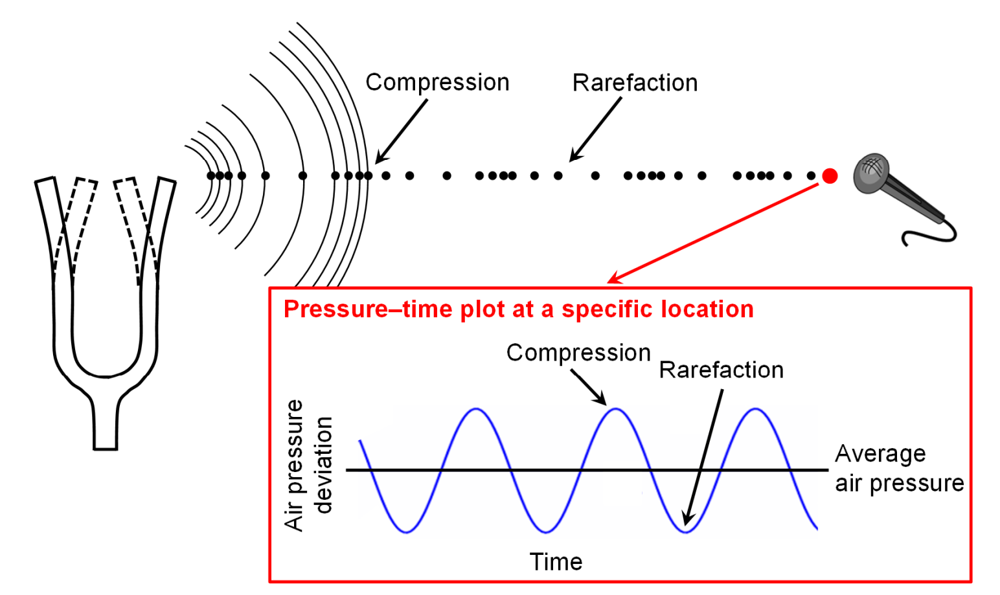


Figure taken from from [Meinard Müller, Fundamentals of Music Processing, Figure 1.17, Springer 2015] [[pdf]](https://www.audiolabs-erlangen.de/content/05-fau/professor/00-mueller/04-bookFMP/02-slides/Mueller_FMP_Chapter1.pdf#page=23)


This is all a `.wav` file is: an ordered list of the sequence of observations made by some sound sensor, which correspond to sound as it passes through the air. With the help of digital-to-analog converters, and conventional loudspeakers, we can convert this list back into vibrations, which move the air and induce the perception of the same sound in listeners. (True enough for the moment).

`librosa` is a useful Python package (developed in the first instance by Brian McFee) that we can use to read `.wav` files into a Python object, which brings with it useful features.

In [5]:
x, sr = librosa.load('data/ticks.wav')

Before we do anything else, let's listen to it.

In [6]:
ipd.Audio(data=x, rate=sr)

 >❓ What do you hear?

Now, let's look at it.

In [7]:
x

array([-2.6607215e-03, -2.2987632e-02, -2.2250537e-02, ...,
       -6.8661270e-06,  2.1066398e-06, -8.6066075e-06], dtype=float32)

> ❓ What do you see?

We're going to need some more insight into this data to draw any serious conclusions. How do we do that with the tools to hand?

`librosa` users benefit from its clear documentation. It used by researchers, educators, and engineers alike. It usefully provides citations to the original papers or conference presentations which describe many of the methods it implements. Some of these are by now well-established methods, and in production and state-of-the-art systems they may not be the first choice. 

But there is great pedagogical value in understanding how to implement even older techniques, and, separately, these older techniques remain fundamental to understanding and explaining the behavior of statistical models which build upon them.

This documentation is available both online and within the source code itself. 

Because Python is an interpreted language, the modules that Python packages provide (sometimes called libraries) are delivered to the user as source code. They can be read by the user in a text editor or IDE.

We can use iPython to inspect the docstring for any function in scope, by typing the name of the function, followed by `?` and executing the cell. We can also get similar information by pressing `Shift + Tab`. We can also use Jupyter Lab to provide similar information with the "Show Contextual Help" feature.

In [92]:
librosa.load?

Signature:
librosa.load(
    path,
    sr=22050,
    mono=True,
    offset=0.0,
    duration=None,
    dtype=<class 'numpy.float32'>,
    res_type='kaiser_best',
)
Docstring:
Load an audio file as a floating point time series.

Audio will be automatically resampled to the given rate
(default ``sr=22050``).

To preserve the native sampling rate of the file, use ``sr=None``.

Parameters
----------
path : string, int, pathlib.Path or file-like object
    path to the input file.

    Any codec supported by `soundfile` or `audioread` will work.

    Any string file paths, or any object implementing Python's
    file interface (e.g. `pathlib.Path`) are supported as `path`.

    If the codec is supported by `soundfile`, then `path` can also be
    an open file descriptor (int).

    On the contrary, if the codec is not supported by `soundfile`
    (for example, MP3), then `path` must be a file path (string or `pathlib.Path`).

sr   : number > 0 [scalar]
    target sampling rate

    'None' us

We can see that the function `librosa.load` returns a `tuple` (of length 2); this is why we assign each of its members to two names:

- `x` - audio time series
- `sr` - sample rate (in Hz, meaning “samples per second”)

Let's find out more about `x` and `sr`.

In [9]:
type(x), type(sr)

(numpy.ndarray, int)

Since x is a time series, it is easily represented as a `numpy` array. 

This means we can easily plot it, with `matplotlib`.

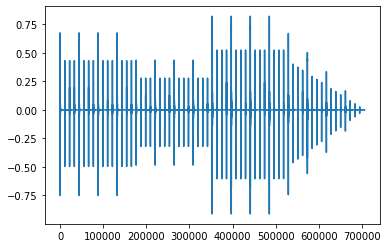

In [10]:
plt.plot(x)
plt.show()

Let's listen again.

> ❓ While listening, can you match up what you hear with what you see? Why?

In [11]:
ipd.Audio(data=x, rate=sr)

We can look more closely at the first 100 values of `x` with [array slicing](https://numpy.org/doc/stable/reference/arrays.indexing.html).

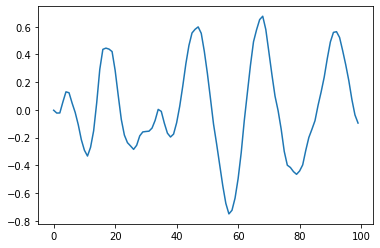

In [12]:
plt.plot(x[:100])
plt.show()

In the plot above, the $y$-axis represents the intensity of a sound wave at sample $i$. The plot shows 100 samples. 

Because the variation of the sound wave is a continuous phenomenon, and digital systems are best at storing discrete data, we represent sound in computers by repeatedly **sampling** a measure of the sound's intensity at a fixed interval. This fixed interval is known known as the **sample rate** (conventionally measured in Hz, or samples per second).

> ❗ In digital audio, the term “sampling“ has a somewhat different meaning than it has in statistics.

Here is a picture that demonstrates what is going on. 

The blue wave depicts a continuous-time representation of as sound wave, perhaps as it might be recorded on an analog recording format (such as tape or vinyl). 

The red stems denote the sampled (and later quantized) values for the intensity of the sound wave at that point, which are stored on a digital medium.

![sampling-M-FMP-adapted.gif](sampling-M-FMP-adapted.gif)

Figure adapted from from [Meinard Müller, Fundamentals of Music Processing, Figure 2.13, Springer 2015] Source: [[pdf]](https://www.audiolabs-erlangen.de/content/05-fau/professor/00-mueller/04-bookFMP/02-slides/Mueller_FMP_Chapter2.pdfpage=28)


WeFor this reason, the plot we've generated above with `plt.plot(x[:100])` has the potential to be misleading, because it connects the observations with a line, which may suggest that the value for the sound file is known at all points in time, which it is not. 

For this reason, the `plt.stem` visualisation is perhaps more useful, since it emphasizes the fact that the signal is now represneted in discrete time.

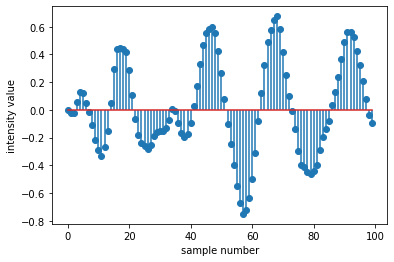

In [85]:
plt.stem(x[:100]) 
plt.xlabel('sample number')
plt.ylabel('intensity value')
plt.show()

> ❓ How can we determine the total duration of the audio snippet, stored in `x`, in seconds?

In [86]:
ipd.Audio(data=x, rate=sr)

In [87]:
x.shape[0] / sr

32.0

Audio samples can be manipulated on their own without much care for the sample rate, but care must be taken when the audio data is converted back into sound, since it is the sample rate that determines the relationship between the audio data and the resulting sound, which takes place in time. 

When the `ipd.Audio` function completes, it returns a HTML5 audio player widget and inserts it into the notebook. 

This widget needs information about the original sample rate of the data it is passed, because it will use this information to determine how quickly (or slowly) to step through the individual samples. 


> ? What do you think will happen if we double the sample rate provided to the audio player? (The original sample rate at time of recording was 22050 Hz).

In [45]:
ipd.Audio(data=x, rate=sr*2)

> ❓ What do you think will happen when we halve the sample rate provided to the audio player?

In [44]:
ipd.Audio(data=x, rate=sr/2)

This means that to correctly locate a position in a recording, which human beings measure in minutes and seconds, using sample indexes, we need to know the original sample rate of the recording.

One way to do this is to pick a sample rate by convention and set this as an environment variable. Another way is to write objects that keep track of the sample rate of the audio data. `librosa` opts for an implementation that goes somewhere between these options: functions that return audio samples (like `librosa.load`) usually return **both** the audio samples and the sample rate. 

We've already seen this above, and is reasonably convenient. If we don't tell `librosa` anything, it will use a default sample rate of 22050Hz.

In [71]:
x, sr = librosa.load('data/ticks.wav')
sr

22050

However, this is not the original sample rate of the file as it is stored on disk. To find that out, we can use the UNIX `file` command.

To run a command in the shell that is hosting the Jupyter notebook, you can prefix a code cell with a `!`.

In [54]:
!file data/ticks.wav

data/ticks.wav: RIFF (little-endian) data, WAVE audio, Microsoft PCM, 16 bit, mono 44100 Hz


What has happened? `librosa` has **downsampled** the original audio file from 44.1kHz to 22.05kHz, which is its default. 

There is also some extra information here about the audio file, which shows that even simple `.wav` files a little more complex than we initially indicated.

We can also tell `librosa` to resample any audio file to a sample rate of our choice, on load.

In [72]:
x_11k, sr_11k = librosa.load(librosa.example('trumpet'), sr=11025)
x_5k, sr_5k = librosa.load(librosa.example('trumpet'), sr=5512)

We will not cover the implementation of this resampling step today. However, it has two consequences:

- a smaller file size for the digital representation of the same length of audio (because fewer samples per second are stored)
- a decrease in the percieved definition of the recording (because less information is stored on disk)

The size of the object is reflected in the shape of the array used to store it. We can also see the nuber of bytes used by Python to store the object with `sys.getsizeof`.

In [67]:
x_11k.shape, x_5k.shape

((352800,), (176384,))

In [68]:
from sys import getsizeof

In [69]:
getsizeof(x_11k), getsizeof(x_5k)

(1411304, 705640)

The change in the definition of the sound is audible. We can think about downsampling as kind of equivalent to changing the resolution of a digital image. 

But don't forget the difference between sampling and quantization: these are two different steps and can be parameterized independently of each other (just like resolution and bit depth in digital images).

{something about lossless and lossy compression and using ffmpeg to get from there to here}

To save us from doing the conversion between sample index and real time, which helps avoid mistakes caused by failing to keep track of the effects of these operations, we can use convenience functions provided by `librosa` that convert between sample index and timestamp, so long as we have the correct sample rate to hand.

`librosa.display` also provides a set of functions for visualising audio, which helpfully label the axes appropriately, using these convenience functions.

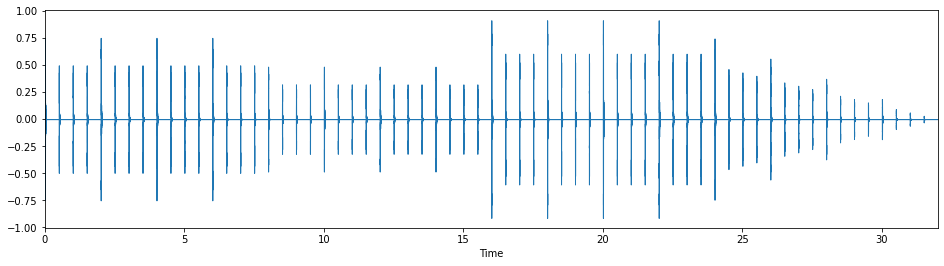

In [17]:
plt.figure(figsize=(16, 4))
librosa.display.waveplot(x, sr=sr)
plt.show()

Even these simple waveplots can help us begin to reason about the structure of the sounds that they represent.

Consider these two examples:

In [18]:
nutcracker_x, nutcracker_sr = librosa.load(librosa.example('nutcracker'))
brahms_x, brahms_sr = librosa.load(librosa.example('brahms'))

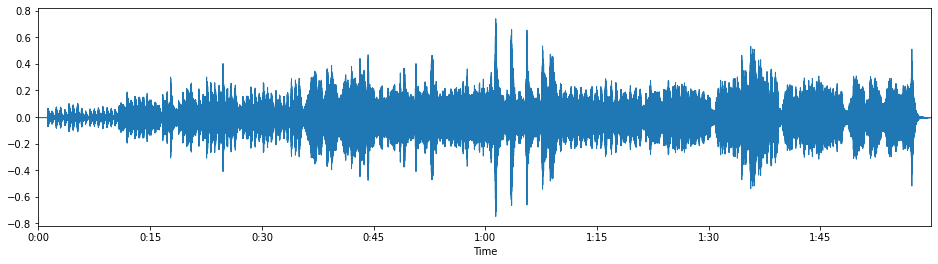

In [19]:
plt.figure(figsize=(16, 4))
librosa.display.waveplot(nutcracker_x, sr=nutcracker_sr)
plt.show()

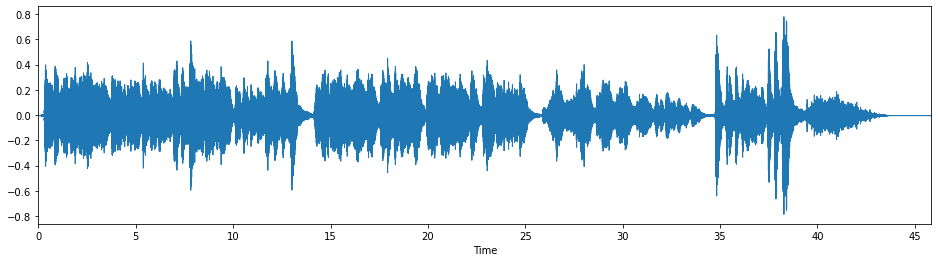

In [20]:
plt.figure(figsize=(16, 4))
librosa.display.waveplot(brahms_x, sr=brahms_sr)
plt.show()

Because the function `librosa.display.waveplot` uses a `matplotlib` function behind the scenes, we can pass keyword arguments supported by `matplotlib` into the `librosa` function.

> ❓ Can you use your knowledge of Python, and the documentation available online,to create a visualisation that includes these two waveplots in the same figure, sharing a common y-axis, but with different colours for each sound file.

- librosa
- matplotlib


## Music's trace is structured sound

- autocorrelation
- fourier (spectrogram)
- "hop size"
- "timbre"

- ticks -> sine tones (constant) -> sine tone (scale - same key) -> bach fugue in sine tones -> piano roll -> western classical -> "live" piano

Up until this point, we have been considering sound as a phenomenon that is represented in the time domain: as a time series of one dimension. This is all well and good.

But if you listen closely to the clicking metronome again, you'll hear that one in every four ticks sounds different from the others in the following pattern: A B B B, A B B B etc. 

In [21]:
x, sr = librosa.load('data/ticks.wav')

ipd.Audio(data=x, rate=sr)

In music theory, we say that two sounds that differ in this way differ in **pitch**, and---in this case---that sound A is **higher** than sound B, in pitch.

Pitch is precisely that perceptual feature of two sounds that allows us to compare (or differentiate) and judge one as being higher or lower, relative either to themselves or an absolute reference. 

> ❗ Pitch is related to frequency, but is not the same as it. Frequency is a feature of a sound, which may be measured objectively. Pitch is a perceptual feature (as in, it's something that listeners experience), which may also be measured, if not completely objectively. 

If we look at the waveplot for the first two sounds, high click followed by low click, it is difficult to tell by inspection which sound has the higher pitch.

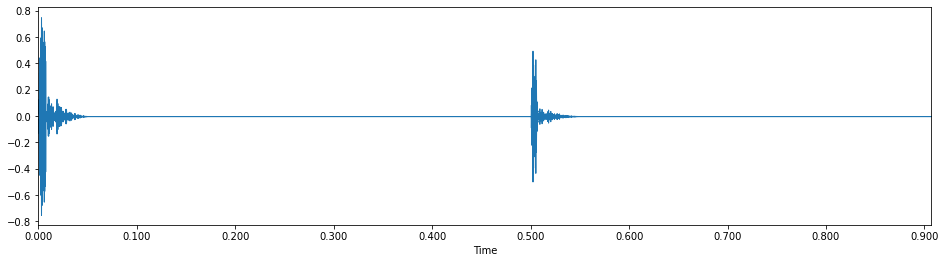

In [22]:
plt.figure(figsize=(16, 4))
librosa.display.waveplot(x[:20000], sr=sr)
plt.show()

Here, I generate a simple sequence of 12 sinusoidal tones, ascending in pitch, one every 0.25 seconds and with 0.25 seconds of silence following.

In [23]:
SAMPLE_RATE = 22050

tones = []

for i in range(12):
    tone = librosa.tone(220 * 2 ** (i/6), duration=0.25, sr=22050)
    tones.append(tone)
    tones.append(np.zeros_like(tone))
    
scale = np.concatenate(tones)

In [24]:
ipd.Audio(scale, rate=22050)

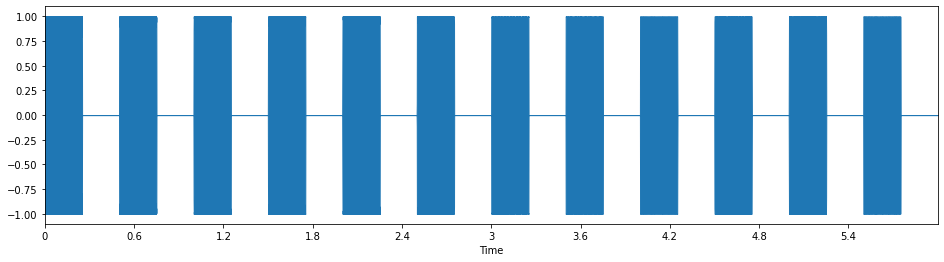

In [25]:
plt.figure(figsize=(16, 4))
librosa.display.waveplot(scale)
plt.show()

In [115]:
X = librosa.stft(scale)
type(X), X.shape

(numpy.ndarray, (1025, 259))

In [114]:
X

array([[ 3.19391150e+01+0.00000000e+00j,  1.59526068e+01+0.00000000e+00j,
        -3.66521467e-02+0.00000000e+00j, ...,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j],
       [-3.20002773e+01-1.67574288e-15j,  8.34034970e-02-1.59839973e+01j,
        -3.71839405e-02+1.15082189e-03j, ...,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j],
       [ 3.22504422e+01+2.01227923e-15j, -1.60942091e+01-1.55043290e-01j,
        -3.88183737e-02+2.35798338e-03j, ...,
         0.00000000e+00-0.00000000e+00j,  0.00000000e+00-0.00000000e+00j,
         0.00000000e+00-0.00000000e+00j],
       ...,
       [-3.13552979e-02+5.41233725e-16j,  1.56776207e-02-1.48182698e-07j,
         3.53427041e-08-7.34604730e-10j, ...,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j],
       [ 3.13550610e-02-4.19803081e-16j, -7.

/srv/conda/envs/notebook/lib/python3.7/site-packages/librosa/display.py:955: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  "Trying to display complex-valued input. " "Showing magnitude instead."


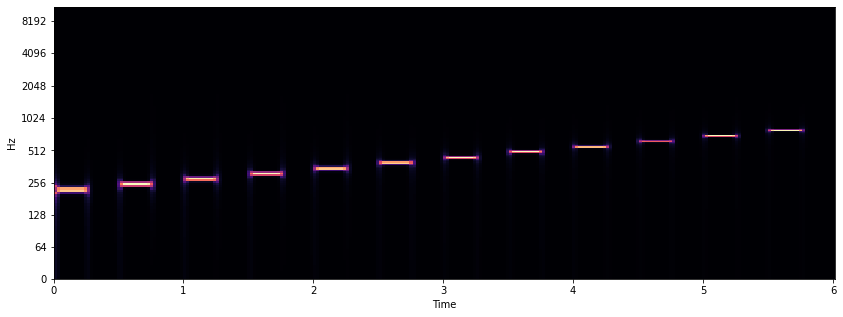

In [27]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(X, sr=sr, x_axis='time', y_axis='log')
plt.show()

In [28]:
tones = []

for i in range(12):
    tone_a = librosa.tone(220 * 2 ** (i / 6), duration=0.25, sr=22050)
    tone_b = librosa.tone(220 * 2 ** ((12 - i) / 6), duration=0.25, sr=22050)
    tone = (tone_a + tone_b) * 0.5
    tones.append(tone)
    tones.append(np.zeros_like(tone))
    
down_and_up = np.concatenate(tones)

In [29]:
ipd.Audio(down_and_up, rate=22050)

/srv/conda/envs/notebook/lib/python3.7/site-packages/librosa/display.py:955: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  "Trying to display complex-valued input. " "Showing magnitude instead."


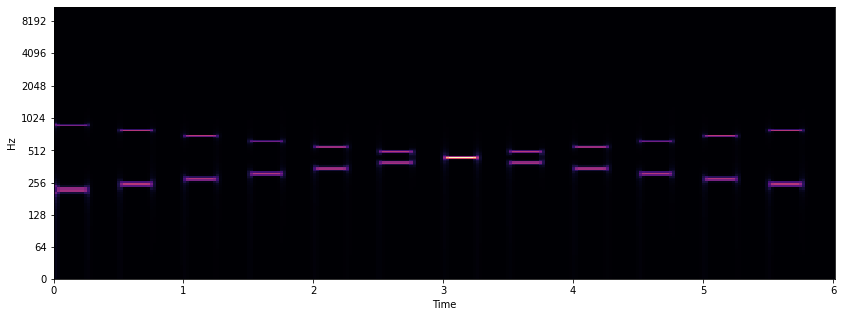

In [89]:
X = librosa.stft(down_and_up)
plt.figure(figsize=(14, 5))
librosa.display.specshow(X, sr=sr, x_axis='time', y_axis='log')
plt.show()

In [95]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))

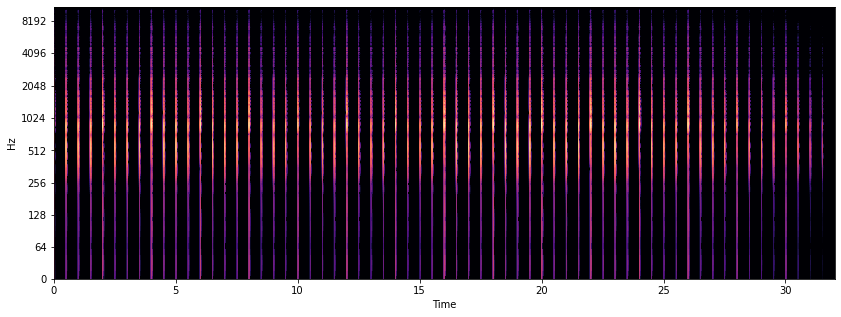

In [96]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.show()

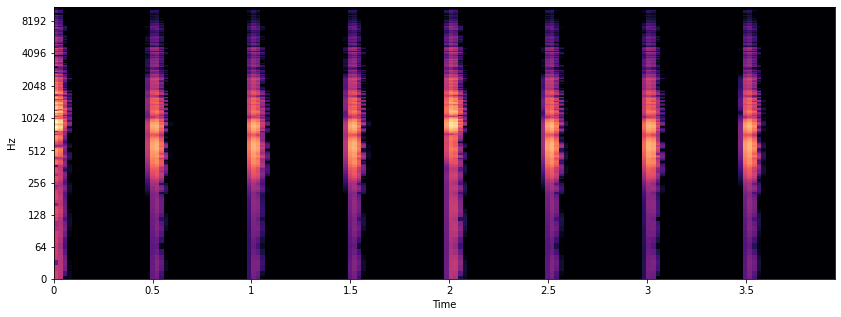

In [104]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb[:,:170], sr=sr, x_axis='time', y_axis='log')
plt.show()

The reality is that sounds produced by natural and acoustic sources are quite complex.

Record yourself speaking (if you like), and examine the spectrogram.

Alternatively, listen to these two examples.

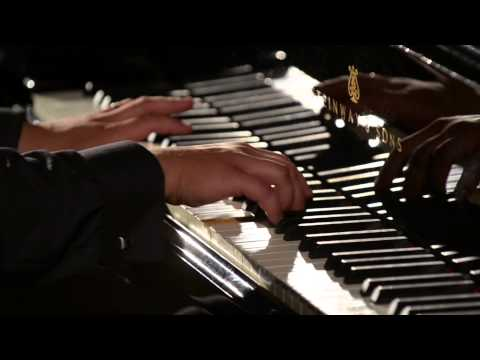

In [43]:
ipd.YouTubeVideo('OcF0CGpK-Vw')

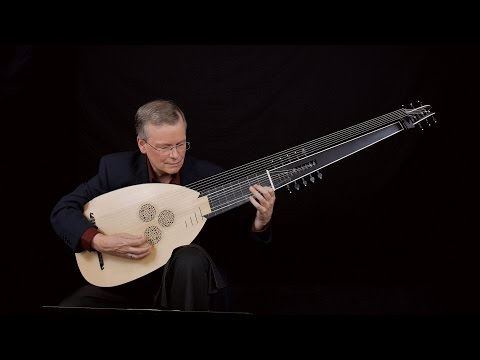

In [35]:
ipd.YouTubeVideo('FnpaMm_2QYc')

At least according to the conventions of Western classical music, we recognise that these two performances are realisations of the same musical work. This is despite obvious differences in the instruments used to play them, as well as differences of other kinds. 

> ❓ What are some of the differences between these two recordings that you can hear?

In popular music, we call different realisations of the same song **covers**, especially when these are not performed by the musicians responsible for writing or first recording the song. In some folk music traditions (Irish traditional music, for example), we call different realisations of the same tune **settings**. In reggae, the production of new recordings with a basis in existing material is called **versioning**. 

The point is that many musical traditions have certain ideas about what counts as productions of "the same thing", even when there are clearly audible differences.

This idea has informed a set of problems in music information retrieval. Some of these tasks include 

- cover detection
- query by humming
- audio--audio alignment (synchronization)

## Musical scores try to capture the structure of music in writing

- representation
- symbolic vs non symbolic

## Detecting time-series features

Let's revisit the mysterious ticking noise from earlier on. It was generated using the Audacity audio editing software, by using the `Generate > Click Track...` functionality.

In [117]:
x, sr = librosa.load('data/ticks.wav')

Click tracks are the modern-day equivalent of an extremely high-tech device, coveted by many European musicians in the early decades of the 19th century: the metronome.

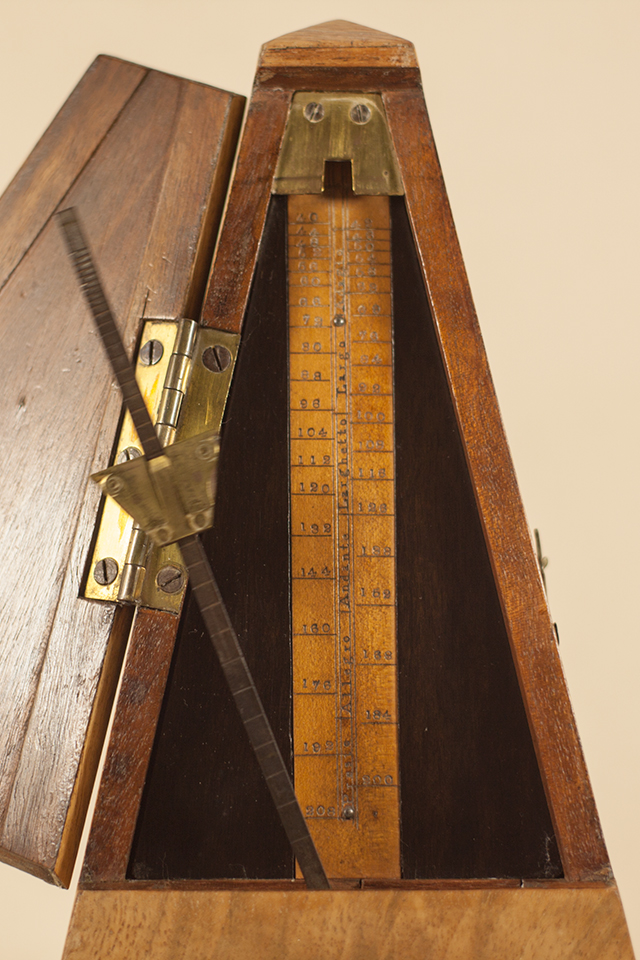

The function of the metronome is to mechanically divide the passage of time into equal chunks, which can be used as the backbone for accurate musical performance. 

When a metronome is used for this purpose, we can say that it is used to set the **tempo** for a performance, which is another word for the *speed* of the beat that you feel when you tap or clap along to a musical work.

By adjusting the location of the weight on the metronome's pendulum, its speed can be increased or decreased. If you look closely at the picture of this metronome you can see how it is marked off both using numbers and Italian terms, which are used conventionally to refer to specific tempos.

Click tracks extend the idea of the metronome for the digital age, and are used widely in studio recordings of popular music, live recordings of film music, and contemporary classical performance.

> ❓ Why do you think click tracks are necessary when recording the music that accompanies film?

**Tempo** is conventionally measured in *beats per minute*, or bpm. This indicates the speed at which most listeners will tap or clap along to a musical sound. 

Let's try and estimate the tempo of this clicking sound by hand.

> ❓ While clapping or tapping to this sound, count the number of times you clap or tap over a fixed period of time, and convert this into bpm. You can use a stopwatch or clock to help with this.

In [121]:
minutes = 0.5
num_claps = 60

bpm = num_claps / minutes
bpm

120.0

We often want to estimate the tempo of recorded music, as it is useful for a number of "downstream" tasks. 

For example, it could be used as a feature in a machine-learned classifciation task that tries to classify tracks by their genre: on average, hip-hop tracks have a lower tempo than techno tracks.

Or it could be used to order a playlist of tracks in a way that is useful for a exercise/workout plan, starting with slower (lower tempo) tracks to warm up, accelerating toward a peak of faster (higher tempo) tracks at the most intense step in the workout.

Of course, we want to do this automatically and short-circuit the tapping-along part of the task.

This is a more complex task than it may initially seem, because of the flexibility of human behaviors in sync with music. However, most conventional approaches (until recently) break the task into two steps:

- identify all the onsets in a track, which is defined as the beginning of a note or other musical sound 
- identify the most salient of these onsets
- analyse the periodicity of the salient onsets (how regular they are)
- determine a candidate for the tempo value

We describe a very simplified form of how this problem could be solved, looking only at time-domain features.

Let's remind ourselves of the shape of the waveform of this clicking sound.

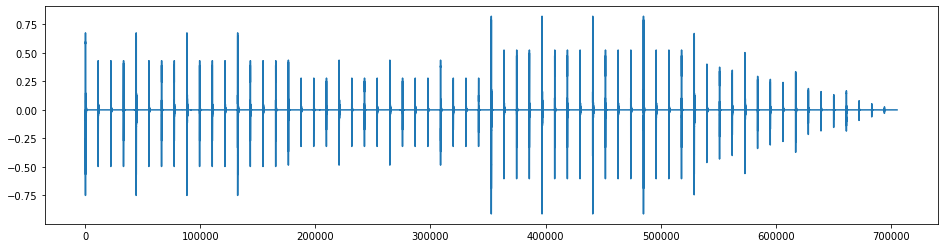

In [161]:
plt.figure(figsize=(16, 4))
plt.plot(x)
plt.show()

We might say that this signal has many peaks: runs of values in the time-series that are relatively higher than their neighbours. In fact, if we listen closely, all the peaks that are visible by eye in this plot are precisely the ones we want to detect.

There are [lots of peak-finding algorithms](https://terpconnect.umd.edu/~toh/spectrum/PeakFindingandMeasurement.htm); we restrict our focus today to the very simple implementation that is bundled with the `scipy` package, `scipy.signal.find_peaks`.

In [186]:
peak_indexes, _ = scipy.signal.find_peaks(x, height=0.5)

In [173]:
scipy.signal.find_peaks?

Signature:
scipy.signal.find_peaks(
    x,
    height=None,
    threshold=None,
    distance=None,
    prominence=None,
    width=None,
    wlen=None,
    rel_height=0.5,
    plateau_size=None,
)
Docstring:
Find peaks inside a signal based on peak properties.

This function takes a 1-D array and finds all local maxima by
simple comparison of neighboring values. Optionally, a subset of these
peaks can be selected by specifying conditions for a peak's properties.

Parameters
----------
x : sequence
    A signal with peaks.
height : number or ndarray or sequence, optional
    Required height of peaks. Either a number, ``None``, an array matching
    `x` or a 2-element sequence of the former. The first element is
    always interpreted as the  minimal and the second, if supplied, as the
    maximal required height.
threshold : number or ndarray or sequence, optional
    Required threshold of peaks, the vertical distance to its neighboring
    samples. Either a number, ``None``, an array ma

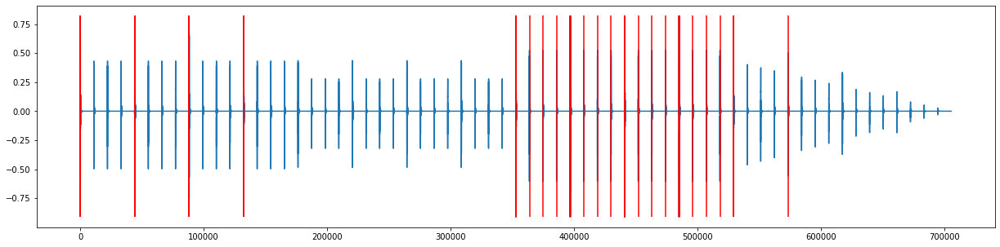

In [189]:
plt.figure(figsize=(21, 5))
plt.plot(x)

# Plot red, vertical lines at the location of each peak index
plt.vlines(peak_indexes, ymin=np.min(x), ymax=np.max(x), colors='r')

plt.show()

How can we compute the tempo from the list of indices for the detected onsets (which in this case, are the locations of the beat)? Recall that the sample rate determines how “fast” time is moving.

Second, in most musical signals, onset detection and beat tracking are different tasks. To get a sense for why this is the case, listen to this example.

- remixing
- downsampling
- clipping
- speeding up etc.

## Segmenting, calculating features, and remixing

- segment, sort, and remix

The last applied section will deal briefly with the use of the `librosa.remix` function.

## Other sources of data about music

- explicit feedback (likes, "hearts", adding to playlist)
- implicit data (skips etc.)
- collaborative filtering [interesting paper - 4S?- I've forgotten about here]
- discography
- text
- motion (video, mocap)
- breathing (Finn Upham)

## Research applications

### Relatively recent questions

### My own research



## Useful resources

### Python modules

### Learning more

- musicinformationretrieval.com
- FMP